In [1]:
import os
from glob import glob
import numpy as np
import dask
import xarray as xr
import cartopy.crs as ccrs
import xgcm
from xgcm.autogenerate import generate_grid_ds
from cmocean import cm

from matplotlib import pyplot as plt
%matplotlib inline

from mitequinox.utils import *
from dask import compute, delayed

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/distributed/utils.py:137: RuntimeWarning: Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [Errno 101] Network is unreachable
  RuntimeWarning,


In [2]:
from dask_jobqueue import PBSCluster
cluster = PBSCluster()
#print(cluster.job_script())
#print(cluster.job_header)
w = cluster.scale(10)

In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [5]:
client

Client Scheduler: tcp://10.148.1.68:46669 Dashboard: http://10.148.1.68:8787/status,Cluster Workers: 10 Cores: 140 Memory: 600.00 GB


_________
# 1. Read dataset


In [6]:
out_dir_zarr = '/home/datawork-lops-osi/equinox/mit4320/zarr/'
store_dir_zarr = '/home/c11-data/Test_aponte/xiaolong/TAU/'

# read rechunked data
grid = xr.open_zarr(out_dir_zarr+'grid.zarr')
ds_TAUX = xr.open_zarr(out_dir_zarr+'oceTAUX.zarr').rename({'i_g': 'i'}).isel(time=slice(0,100))
ds_TAUY = xr.open_zarr(out_dir_zarr+'oceTAUY.zarr').rename({'j_g': 'j'}).isel(time=slice(0,100))

# data merge
ds = xr.merge([ds_TAUX,ds_TAUY,grid])
print(ds)

<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, k: 90, k_l: 90, k_p1: 91, k_u: 90, time: 100)
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    niter    (time) int64 dask.array<chunksize=(100,), meta=np.ndarray>
  * time     (time) datetime64[ns] 2011-11-23T08:00:00 ... 2011-11-27T11:00:00
    CS       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    Depth    (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    PHrefC   (k) float32 dask.array<chunksize=(90,), meta=np.ndarray>
    PHrefF   (k_p1) float32 dask.array<chunksize=(91,), meta=np.ndarray>
    SN       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    XC       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>

In [7]:
# coriolis term
lat = ds['YC']
omega = 7.3/100000
f_ij = 2*omega*np.sin(np.deg2rad(lat))
f_ij

<xarray.DataArray 'YC' (face: 13, j: 4320, i: 4320)>
dask.array<mul, shape=(13, 4320, 4320), dtype=float32, chunksize=(1, 4320, 4320), chunktype=numpy.ndarray>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    CS       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    Depth    (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SN       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    XC       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    YC       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    rA       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>

In [12]:
overwrite=True
    
for face in range(13):
#for face in [1]:

    Efile = store_dir_zarr+'uv_ek_rotation_f%02d.zarr'%(face)

    if not os.path.isdir(Efile) or overwrite:
        
        oceTAUX_rotation =  ds.oceTAUX.isel(face=face)*ds.CS.isel(face=face) - ds.oceTAUY.isel(face=face)*ds.SN.isel(face=face)
        oceTAUY_rotation =  ds.oceTAUX.isel(face=face)*ds.SN.isel(face=face) + ds.oceTAUY.isel(face=face)*ds.CS.isel(face=face)
        ELD = 0.2*np.sqrt(np.sqrt(oceTAUX_rotation**2 + oceTAUY_rotation**2)/1025)/np.abs(f_ij.isel(face=face))
        
        
        u_ek =  oceTAUY_rotation.isel(j=slice(0 ,None, 4), i=slice(0, None, 4))/(1025 * ELD.isel(j=slice(0 ,None, 4), i=slice(0, None, 4)) * np.abs(f_ij.isel(face=face).isel(j=slice(0 ,None, 4), i=slice(0, None, 4))))
        v_ek =  -oceTAUX_rotation.isel(j=slice(0 ,None, 4), i=slice(0, None, 4))/(1025 * ELD.isel(j=slice(0 ,None, 4), i=slice(0, None, 4)) * np.abs(f_ij.isel(face=face).isel(j=slice(0 ,None, 4), i=slice(0, None, 4))))
        u_ek = np.real(u_ek).rename('u_ek')
        v_ek = np.real(v_ek).rename('v_ek')
#        print(u_ek)
        oceTAUX_H = xr.merge([u_ek,v_ek])
        chunks = {'i': 1080, 'j': 1080}
        oceTAUX_H = oceTAUX_H.chunk(chunks)
#        print(oceTAUX_H)
        # store
        #oceTAUX_H = np.real(oceTAUX_H).rename('uv_ek')
        #oceTAUX_H = oceTAUX_H.to_dataset()
        
        for c in oceTAUX_H.coords:
            try:
                del E[c].encoding['chunks']
            except:
                pass        
        
        %time oceTAUX_H.to_zarr(Efile, mode='w')

        print('--- face %d done'%face)

    else:
        print('--- face %d allready computed'%face)

CPU times: user 2.39 s, sys: 176 ms, total: 2.56 s
Wall time: 10.9 s
--- face 0 done
CPU times: user 2.44 s, sys: 228 ms, total: 2.66 s
Wall time: 10.9 s
--- face 1 done
CPU times: user 2.42 s, sys: 196 ms, total: 2.61 s
Wall time: 10.6 s
--- face 2 done
CPU times: user 2.68 s, sys: 188 ms, total: 2.87 s
Wall time: 12.7 s
--- face 3 done
CPU times: user 2.44 s, sys: 204 ms, total: 2.64 s
Wall time: 11.2 s
--- face 4 done
CPU times: user 2.55 s, sys: 240 ms, total: 2.79 s
Wall time: 12.9 s
--- face 5 done
CPU times: user 2.75 s, sys: 188 ms, total: 2.94 s
Wall time: 11.5 s
--- face 6 done
CPU times: user 2.75 s, sys: 192 ms, total: 2.94 s
Wall time: 13.1 s
--- face 7 done
CPU times: user 2.59 s, sys: 200 ms, total: 2.79 s
Wall time: 12.1 s
--- face 8 done
CPU times: user 2.51 s, sys: 180 ms, total: 2.69 s
Wall time: 11 s
--- face 9 done
CPU times: user 2.4 s, sys: 172 ms, total: 2.57 s
Wall time: 9.99 s
--- face 10 done
CPU times: user 2.67 s, sys: 184 ms, total: 2.86 s
Wall time: 12.3 

In [13]:
store_dir_zarr = '/home/c11-data/Test_aponte/xiaolong/TAU/'
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

D = [xr.open_zarr(store_dir_zarr+'uv_ek_rotation_f%02d.zarr'%(face)) for face in face_all] 
ds_ek = xr.concat(D, dim='face')
ds_ek

<xarray.Dataset>
Dimensions:  (face: 13, i: 1080, j: 1080, time: 100)
Coordinates:
    niter    (time) int64 256896 257040 257184 257328 ... 270864 271008 271152
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * time     (time) datetime64[ns] 2011-11-23T08:00:00 ... 2011-11-27T11:00:00
    CS       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    Depth    (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    SN       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    XC       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    YC       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    rA       (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
Data varia

In [20]:
out_dir_zarr = '/home/datawork-lops-osi/equinox/mit4320/zarr/'

ice = xr.open_zarr(out_dir_zarr+'sea_ice_mask.zarr').isel(j=slice(0 ,None, 4), i=slice(0, None, 4))
ice

<xarray.Dataset>
Dimensions:  (face: 13, i: 1080, j: 1080)
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
Data variables:
    AREA     (face, j, i) float64 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the

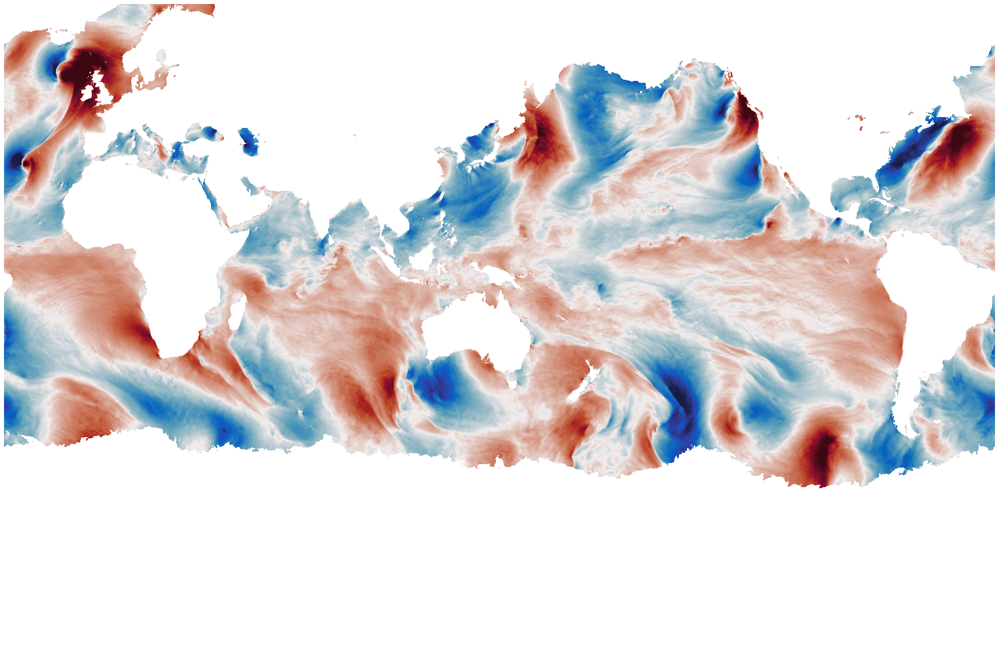

In [21]:
quick_llc_plot(ds_ek.u_ek.sel(time='2011-11-24T08:00:00').where(ice.AREA>0), vmin=-0.1, vmax=0.1, add_colorbar=False, axis_off=True, cmap = cm.balance)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the

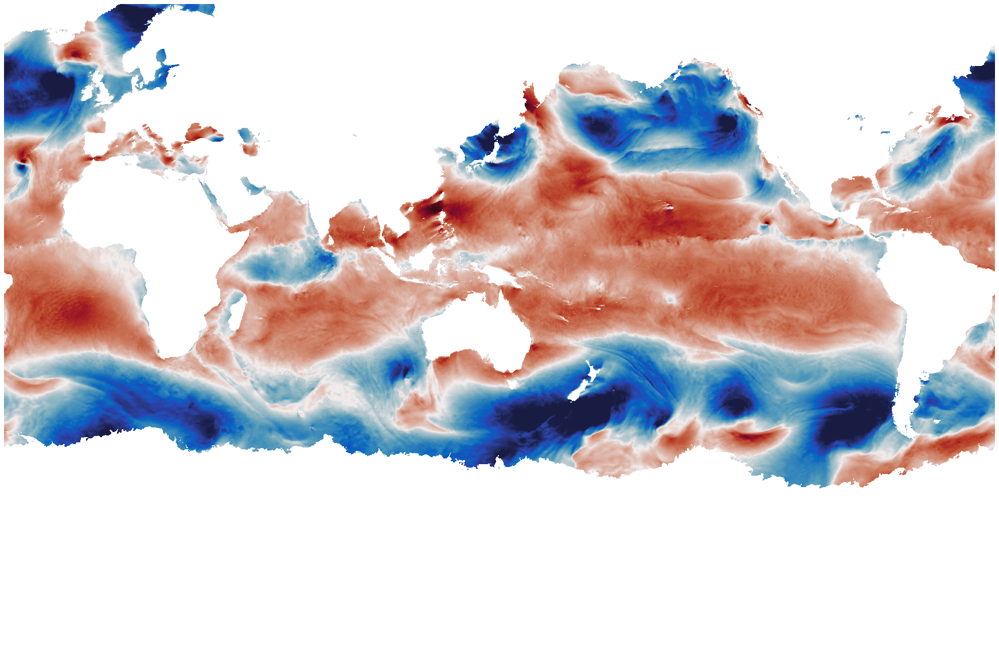

In [22]:
quick_llc_plot(ds_ek.v_ek.sel(time='2011-11-24T08:00:00').where(ice.AREA>0), vmin=-0.1, vmax=0.1, add_colorbar=False, axis_off=True, cmap = cm.balance)

______________
# RMS

In [16]:
u_ek_rms = np.sqrt((u_ek**2).mean(['time']))
v_ek_rms = np.sqrt((v_ek**2).mean(['time']))

In [26]:
overwrite=True
    
for face in range(13):
#for face in [1]:

    Efile = store_dir_zarr+'u_ek_rms_f%02d.zarr'%(face)

    if not os.path.isdir(Efile) or overwrite:

        u_ek_rms = np.sqrt((u_ek.isel(face=face)**2).mean(['time']))

     
        chunks = {'i': 4320, 'j': 4320}
        u_ek_rms = u_ek_rms.chunk(chunks)
        
        # store
        u_ek_rms = np.real(u_ek_rms).rename('u_ek_rms')
        u_ek_rms = u_ek_rms.to_dataset()
        
        for c in u_ek_rms.coords:
            try:
                del E[c].encoding['chunks']
            except:
                pass        
        
        %time u_ek_rms.to_zarr(Efile, mode='w')

        print('--- face %d done'%face)

    else:
        print('--- face %d allready computed'%face)

CPU times: user 15 s, sys: 1.24 s, total: 16.2 s
Wall time: 2min 1s
--- face 0 done
CPU times: user 10.9 s, sys: 1 s, total: 11.9 s
Wall time: 1min 20s
--- face 1 done
CPU times: user 16.5 s, sys: 1.42 s, total: 17.9 s
Wall time: 2min 14s
--- face 2 done
CPU times: user 13.1 s, sys: 1.33 s, total: 14.4 s
Wall time: 1min 45s
--- face 3 done
CPU times: user 18 s, sys: 1.76 s, total: 19.8 s
Wall time: 2min 56s
--- face 4 done
CPU times: user 12 s, sys: 1.17 s, total: 13.2 s
Wall time: 1min 32s
--- face 5 done
CPU times: user 18.2 s, sys: 1.49 s, total: 19.7 s
Wall time: 2min 51s
--- face 6 done
CPU times: user 16.3 s, sys: 1.41 s, total: 17.7 s
Wall time: 2min 20s
--- face 7 done
CPU times: user 18 s, sys: 1.73 s, total: 19.7 s
Wall time: 2min 52s
--- face 8 done
CPU times: user 15.3 s, sys: 1.4 s, total: 16.7 s
Wall time: 2min 9s
--- face 9 done
CPU times: user 14.4 s, sys: 1.41 s, total: 15.8 s
Wall time: 2min 2s
--- face 10 done
CPU times: user 17.2 s, sys: 1.51 s, total: 18.7 s
Wall t

In [17]:
overwrite=True
    
for face in range(13):
#for face in [1]:

    Efile = store_dir_zarr+'v_ek_rms_f%02d.zarr'%(face)

    if not os.path.isdir(Efile) or overwrite:

        v_ek_rms = np.sqrt((v_ek.isel(face=face)**2).mean(['time']))
        chunks = {'i': 4320, 'j': 4320}
        v_ek_rms = v_ek_rms.chunk(chunks)
        
        # store
        v_ek_rms = np.real(v_ek_rms).rename('v_ek_rms')
        v_ek_rms = v_ek_rms.to_dataset()
        
        for c in v_ek_rms.coords:
            try:
                del E[c].encoding['chunks']
            except:
                pass        
        
        %time v_ek_rms.to_zarr(Efile, mode='w')

        print('--- face %d done'%face)

    else:
        print('--- face %d allready computed'%face)

CPU times: user 15.5 s, sys: 1.3 s, total: 16.9 s
Wall time: 2min 18s
--- face 0 done
CPU times: user 17.6 s, sys: 1.37 s, total: 18.9 s
Wall time: 2min 48s
--- face 1 done
CPU times: user 15.2 s, sys: 1.32 s, total: 16.5 s
Wall time: 2min 9s
--- face 2 done
CPU times: user 12 s, sys: 1.19 s, total: 13.2 s
Wall time: 1min 32s
--- face 3 done
CPU times: user 18.4 s, sys: 1.72 s, total: 20.2 s
Wall time: 3min 9s
--- face 4 done
CPU times: user 12.3 s, sys: 1.07 s, total: 13.3 s
Wall time: 1min 30s
--- face 5 done
CPU times: user 17.4 s, sys: 1.69 s, total: 19.1 s
Wall time: 2min 48s
--- face 6 done
CPU times: user 17.9 s, sys: 1.48 s, total: 19.4 s
Wall time: 2min 49s
--- face 7 done
CPU times: user 18.7 s, sys: 1.76 s, total: 20.4 s
Wall time: 3min 11s
--- face 8 done
CPU times: user 15.8 s, sys: 1.38 s, total: 17.1 s
Wall time: 2min 14s
--- face 9 done
CPU times: user 15.5 s, sys: 1.32 s, total: 16.8 s
Wall time: 2min 13s
--- face 10 done
CPU times: user 18.3 s, sys: 1.65 s, total: 19.

In [18]:
store_dir_zarr = '/home/c11-data/Test_aponte/xiaolong/TAU/'
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

D = [xr.open_zarr(store_dir_zarr+'u_ek_rms_f%02d.zarr'%(face)) for face in face_all] 
u_ek_rms = xr.concat(D, dim='face')
u_ek_rms

D = [xr.open_zarr(store_dir_zarr+'v_ek_rms_f%02d.zarr'%(face)) for face in face_all] 
v_ek_rms = xr.concat(D, dim='face')
v_ek_rms

<xarray.Dataset>
Dimensions:   (face: 13, i: 4320, j: 4320)
Coordinates:
  * j         (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * i         (i) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    CS        (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    Depth     (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    SN        (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    XC        (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    YC        (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
  * face      (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    rA        (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
Data variables:
    v_ek_rms  (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>

In [18]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the

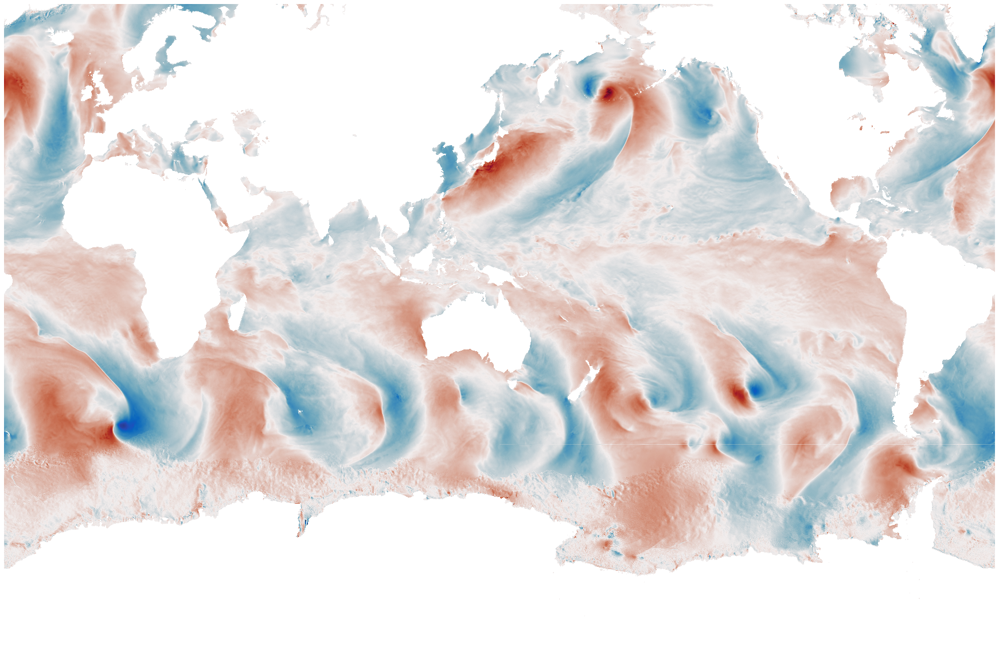

In [47]:
quick_llc_plot(u_ek.isel(time=4), vmin=-0.1, vmax=0.1, add_colorbar=False, axis_off=True, cmap = cm.balance)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the

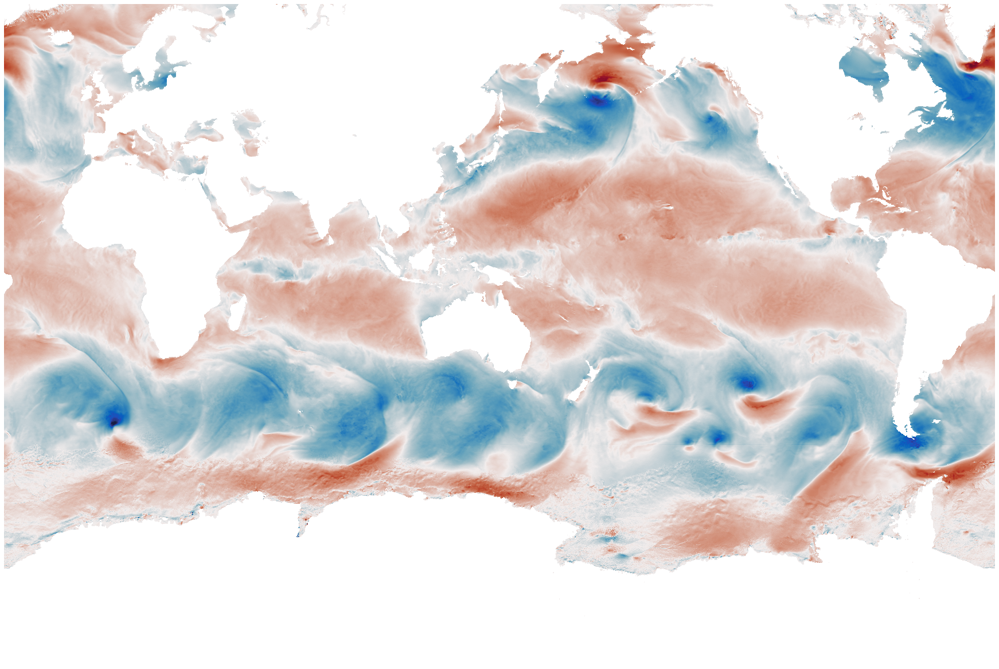

In [46]:
quick_llc_plot(v_ek.isel(time=4), vmin=-0.1, vmax=0.1, add_colorbar=False, axis_off=True, cmap = cm.balance)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the

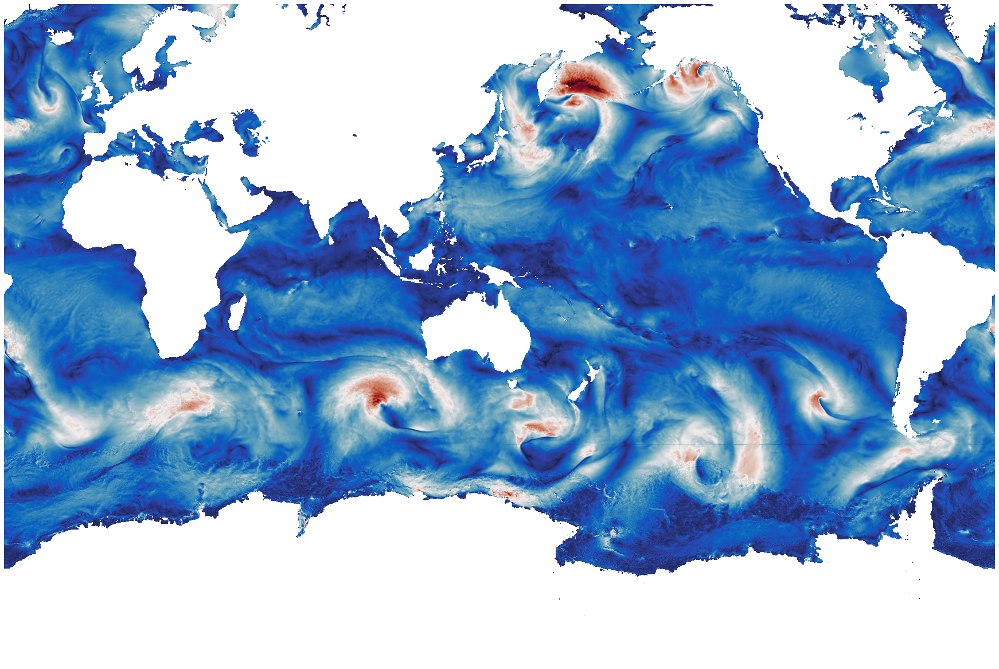

In [26]:
quick_llc_plot(np.sqrt(u_ek.isel(time=1)**2 + v_ek.isel(time=1)**2 ), vmin=0, vmax=0.1, add_colorbar=False, axis_off=True, cmap = cm.balance)

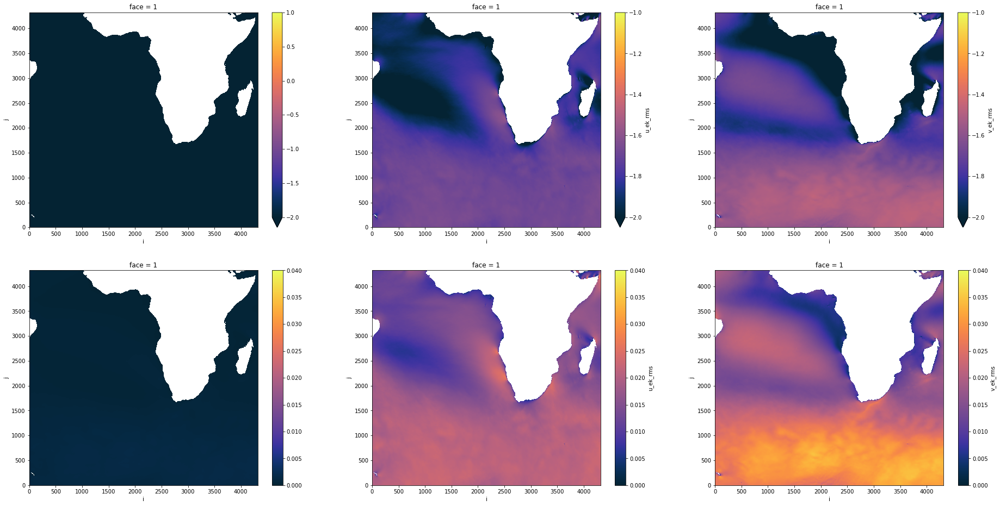

In [27]:
fig, ax = plt.subplots(figsize=(32,16))

ax = plt.subplot(231)
np.log10(u_ek_rms.u_ek_rms.isel(face=1)**2 + v_ek_rms.v_ek_rms.isel(face=1)**2 ).plot(x='i', y='j', cmap = cm.thermal, vmin=-2,vmax=1)

ax = plt.subplot(232)
np.log10(u_ek_rms.u_ek_rms.isel(face=1)).plot(x='i', y='j', cmap = cm.thermal, vmin=-2,vmax=-1)

ax = plt.subplot(233)
np.log10(v_ek_rms.v_ek_rms.isel(face=1)).plot(x='i', y='j', cmap = cm.thermal, vmin=-2,vmax=-1)

ax = plt.subplot(234)
(u_ek_rms.u_ek_rms.isel(face=1)**2 + v_ek_rms.v_ek_rms.isel(face=1)**2 ).plot(x='i', y='j', cmap = cm.thermal, vmin=0,vmax=0.04)

ax = plt.subplot(235)
(u_ek_rms.u_ek_rms.isel(face=1)).plot(x='i', y='j', cmap = cm.thermal, vmin=0,vmax=0.04)

ax = plt.subplot(236)
(v_ek_rms.v_ek_rms.isel(face=1)).plot(x='i', y='j', cmap = cm.thermal, vmin=0,vmax=0.04)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the

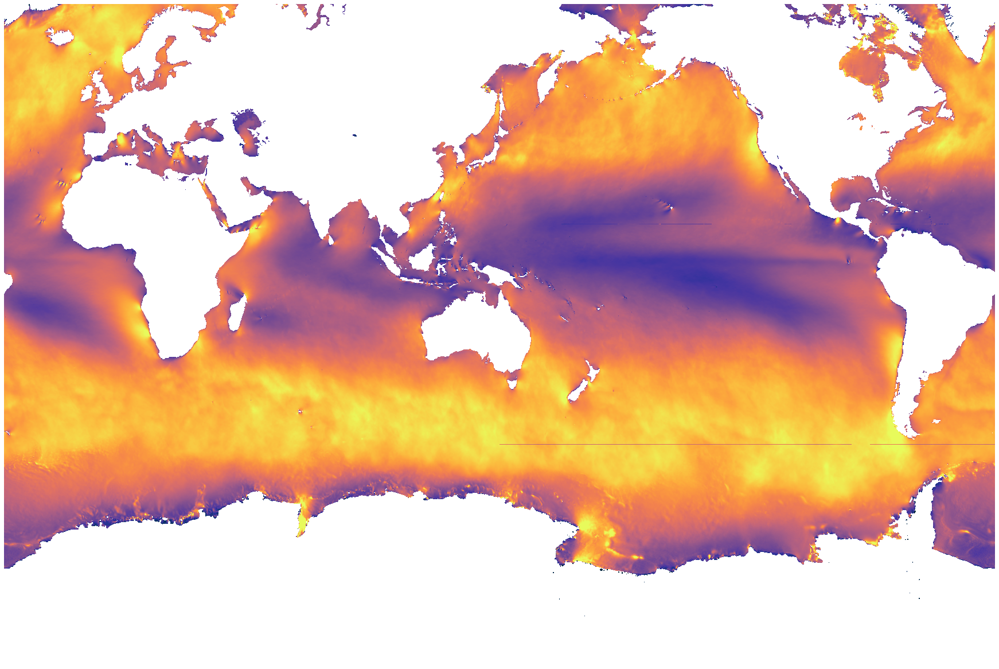

In [32]:
quick_llc_plot(u_ek_rms.u_ek_rms, vmin=0, vmax=0.025, add_colorbar=False, axis_off=True, cmap = cm.thermal)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the

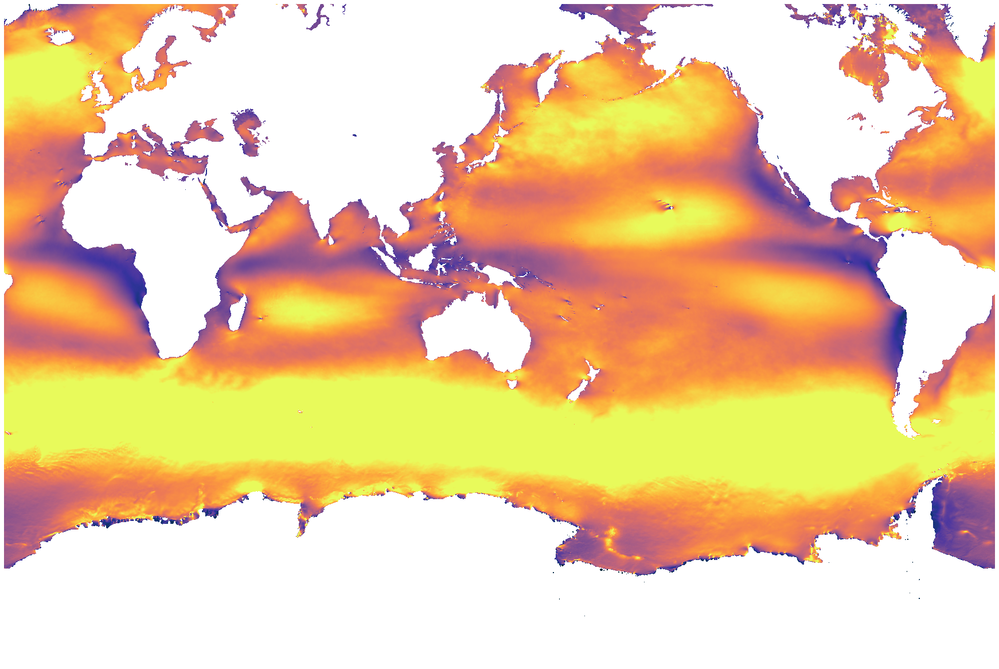

In [24]:
quick_llc_plot(v_ek_rms.v_ek_rms, vmin=0, vmax=0.025, add_colorbar=False, axis_off=True, cmap = cm.thermal)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the

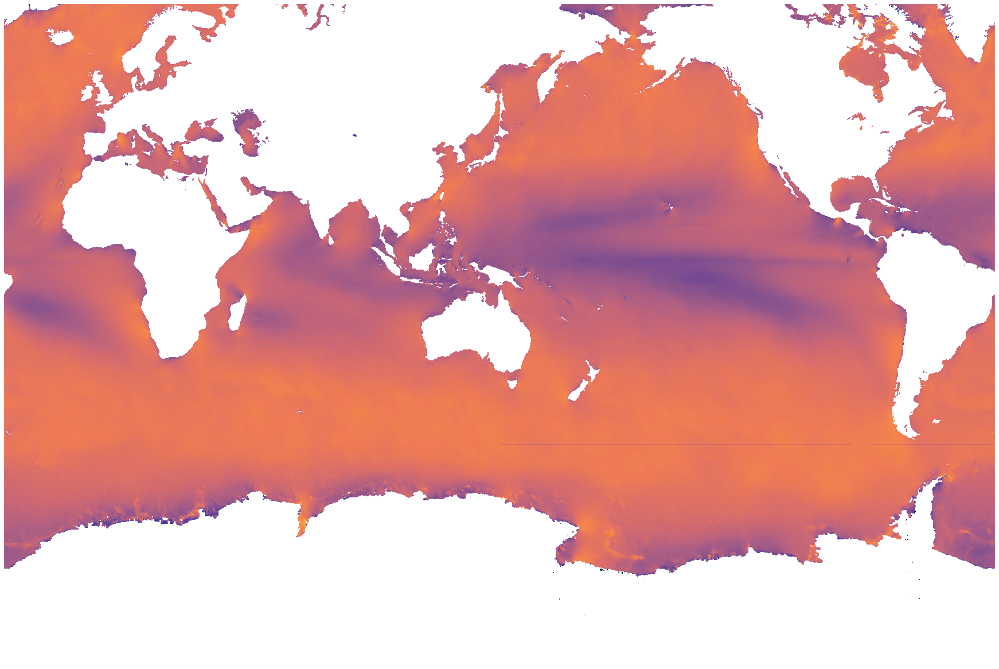

In [33]:
quick_llc_plot(np.log10(u_ek_rms.u_ek_rms), vmin=-3, vmax=-1, add_colorbar=False, axis_off=True, cmap = cm.thermal)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the

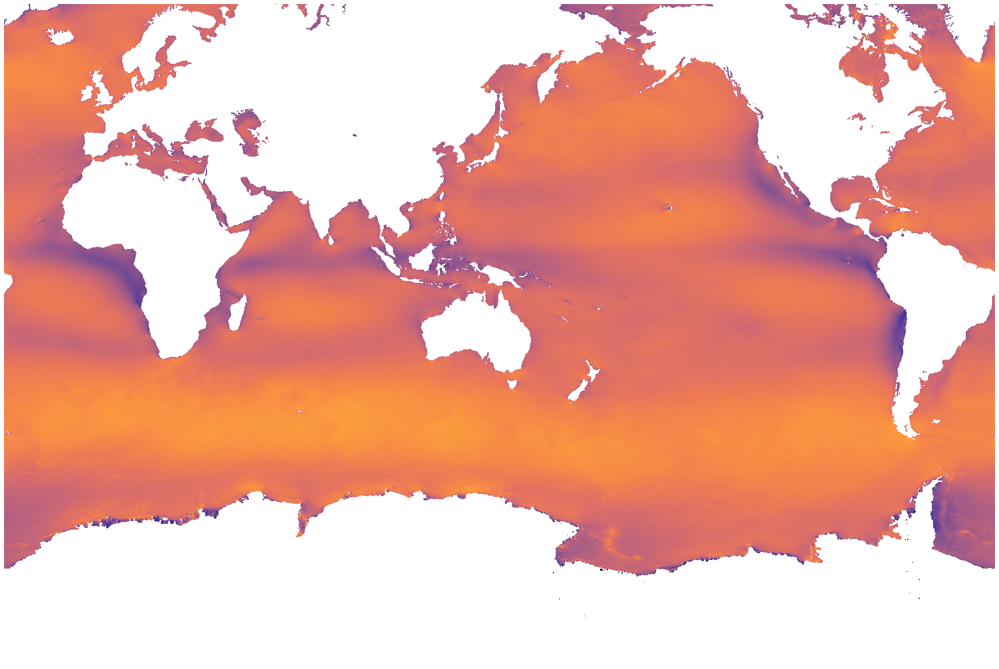

In [25]:
quick_llc_plot(np.log10(v_ek_rms.v_ek_rms), vmin=-3, vmax=-1, add_colorbar=False, axis_off=True, cmap = cm.thermal)

In [5]:
out_dir_zarr = '/home/datawork-lops-osi/equinox/mit4320/zarr/'

# read rechunked data
grid = xr.open_zarr(out_dir_zarr+'grid.zarr')
ds_TAUX = xr.open_zarr(out_dir_zarr+'oceTAUX.zarr')

# data merge
ds = xr.merge([ds_TAUX,grid])
print(ds)

<xarray.Dataset>
Dimensions:  (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, k: 90, k_l: 90, k_p1: 91, k_u: 90, time: 7207)
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i_g      (i_g) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
  * j        (j) int64 0 1 2 3 4 5 6 7 ... 4313 4314 4315 4316 4317 4318 4319
    niter    (time) int64 dask.array<chunksize=(200,), meta=np.ndarray>
  * time     (time) datetime64[ns] 2011-09-21T08:00:00 ... 2012-07-17T14:00:00
    CS       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    Depth    (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    PHrefC   (k) float32 dask.array<chunksize=(90,), meta=np.ndarray>
    PHrefF   (k_p1) float32 dask.array<chunksize=(91,), meta=np.ndarray>
    SN       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarray>
    XC       (face, j, i) float32 dask.array<chunksize=(1, 4320, 4320), meta=np.ndarr

Text(0.5, 1.0, 'v ek')

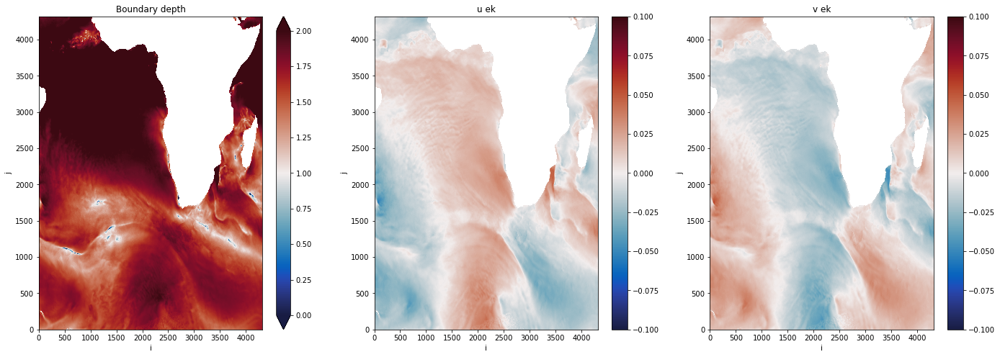

In [21]:
fig, ax = plt.subplots(figsize=(32,8))

ax = plt.subplot(141)
np.log10(Ekman_layer_depth.isel(face=1,time=10)).plot(x='i', y='j', cmap = cm.balance, vmin=0,vmax=2)
ax.set_title('Boundary depth')

ax = plt.subplot(142)
(u_ek.isel(face=1,time=10)).plot(x='i', y='j', cmap = cm.balance, vmin=-0.1,vmax=0.1)
ax.set_title('u ek')

ax = plt.subplot(143)
(v_ek.isel(face=1,time=10)).plot(x='i', y='j', cmap = cm.balance, vmin=-0.1,vmax=0.1)
ax.set_title('v ek')


In [ ]:
cluster.close()